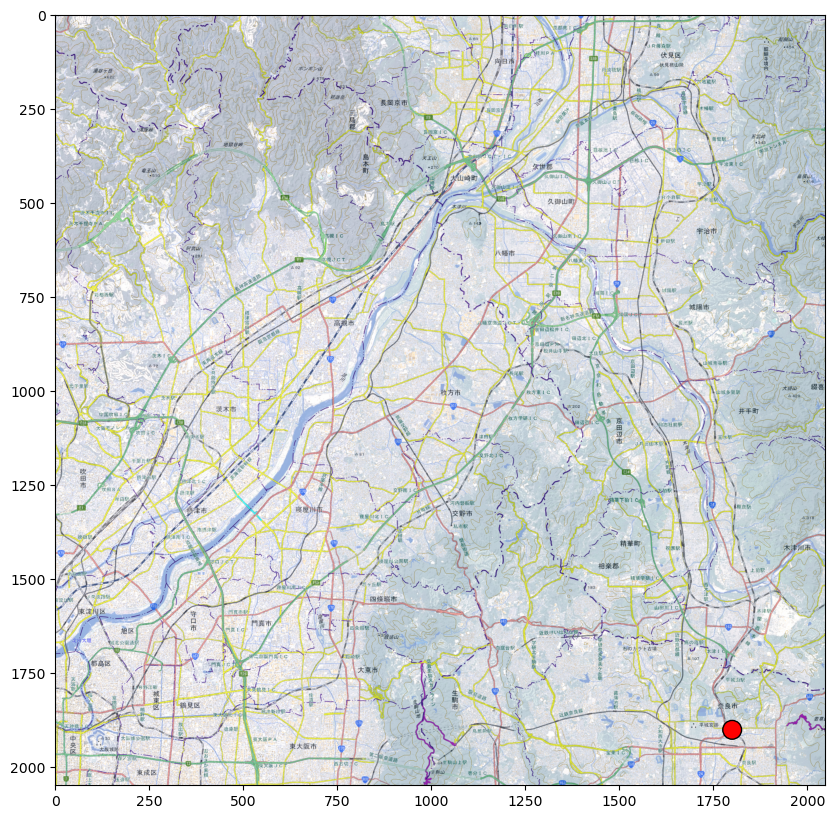

In [1]:
import math; import numpy as np
import matplotlib.pyplot as plt
from imageio.v3 import imread, imwrite
from matplotlib.patches import Circle

# 地図画像と写真画像(2048, 2048, 4)を読む
texture_map = imread('texture.png'); texture_photo = imread('texture-2.png')
texture = (texture_map*0.7+texture_photo*0.3)/255 # 地図・写真を適当に合成する
texture_size, _ ,_ = texture.shape
nara_pos = np.array([1800,1900])/texture_size # 受信場所を、奈良市内で適当に設定
# 読み込んだ画像を表示する。また、適当に選択した「奈良市内」場所をプロットする
fig = plt.figure(figsize=[10,10]); ax = fig.subplots(1); ax.imshow(texture)
ax.add_patch(Circle(tuple(nara_pos*texture_size), 25, fc='r', ec='k'))

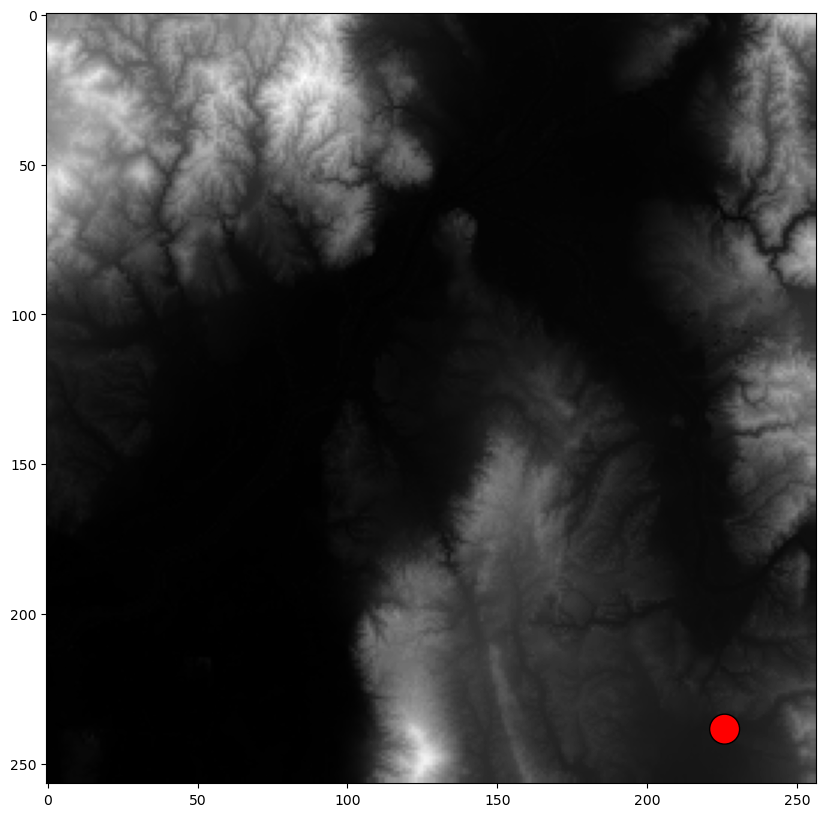

In [2]:
# 標高情報（CSVファイル）を読み込む
dem = np.loadtxt('dem.csv', delimiter=',')
dem_size = 257; dem = 100*dem.reshape([dem_size,dem_size])
# 標高情報を画像として表示する
fig = plt.figure(figsize=[10,10]); ax = fig.subplots(1)
ax.imshow(dem, cmap = "gray")
ax.add_patch(Circle(tuple(nara_pos*dem_size),5,fc='r',ec='k'))

In [4]:
visibility_map = np.zeros_like(dem)         # 見通しマップ: 0->False,1->True
start_pos = (nara_pos*dem_size).astype(int) # 初期位置（奈良市内の適当な場所）
pos_step = 1.0                              # DEM座標上の探索進行程度 
for theta in np.arange(0, 2*math.pi, math.pi/10000): # 周方向(南=0、左回り)
    for s in np.arange(0.000001, 3, 0.001):          # 仰角方向（水平方向が0）
        y = y0 = start_pos[0]; x = x0 = start_pos[1];# 探索を開始する原点
        z =  dem[y0, x0]+0.75 #  0.5
        while True: # 直線的に「DEMにぶつかるか」探索
            y = y + math.sin(theta) * pos_step
            x = x + math.cos(theta) * pos_step
            z = z + s
            if y<0 or dem_size<=y or x<0 or dem_size<=x:
                break  # 領域外に出たらループ脱出
            if dem[int(y), int(x)] > z:
                visibility_map[int(y), int(x)] = 1
                break  # DEMに到達したらフラグを立てループ脱出

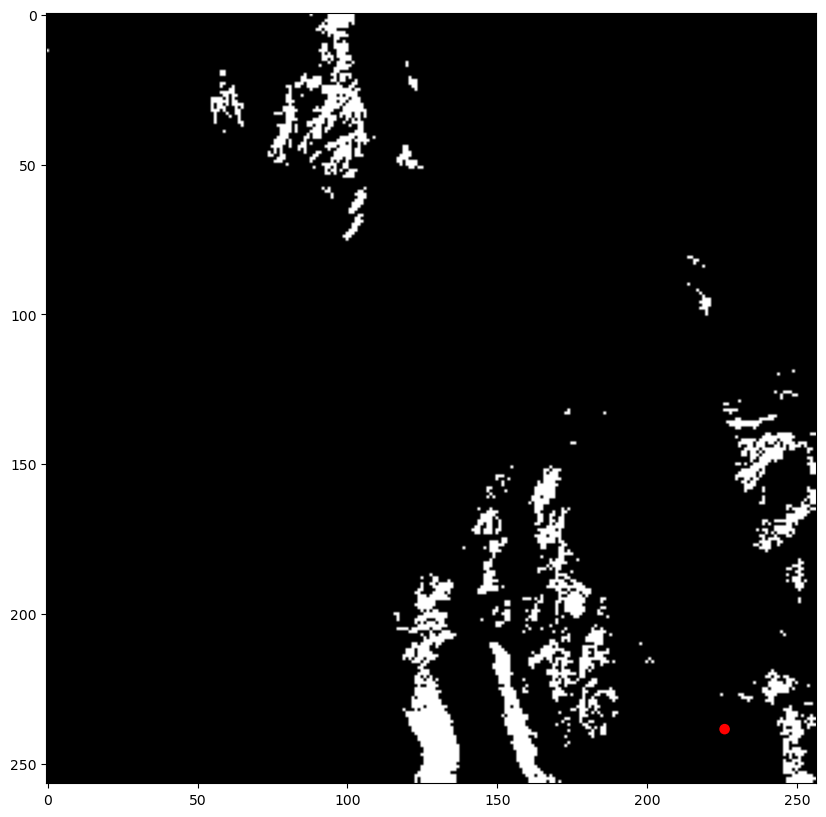

In [5]:
fig = plt.figure(figsize=[10,10]); ax = fig.subplots(1)
ax.imshow(visibility_map, cmap = "gray")
ax.add_patch(Circle(tuple(nara_pos*dem_size),2, fc='r', ec='k'))

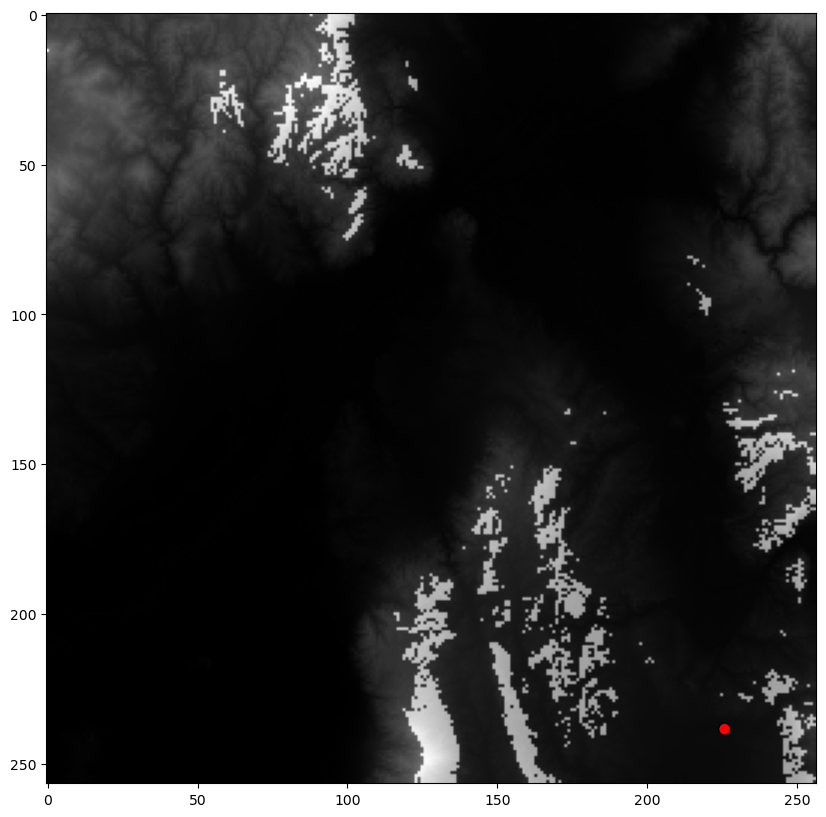

In [6]:
fig = plt.figure(figsize=[10,10])
ax = fig.subplots(1)
ax.imshow(
    dem*0.5+visibility_map*255.*0.5,
    cmap = "gray")
ax.add_patch(Circle(tuple(nara_pos*dem_size),2, fc='r', ec='k'))

In [8]:
result = np.copy(texture)
for y in range(2048):
    for x in range(2048):
        if visibility_map[int(y/8.0), int(x/8.0)]:
            result[y,x] = [1,0,0,1]

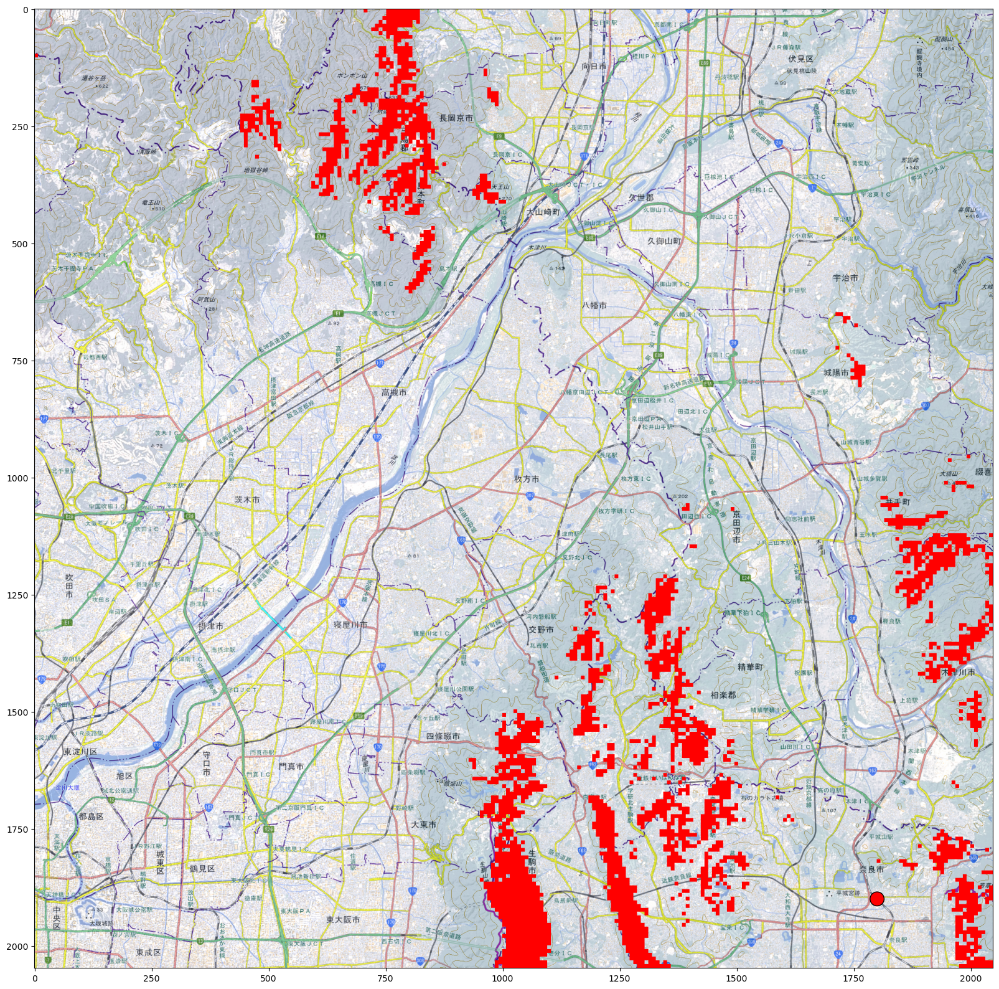

In [12]:
fig = plt.figure(figsize=[20,20]); ax = fig.subplots(1)
ax.imshow(result, cmap = "gray")
ax.add_patch(Circle(tuple(nara_pos*texture_size),15, fc='r', ec='k'))

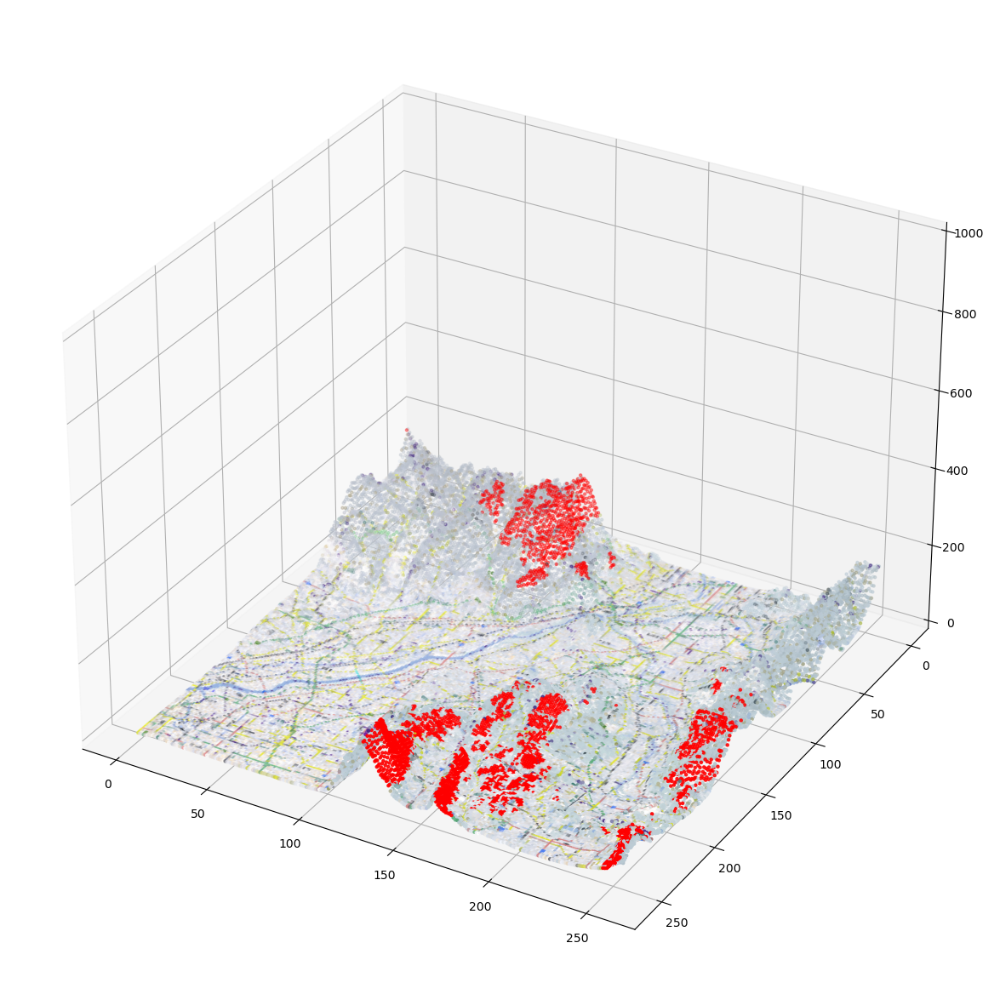

In [20]:
import cv2; from mpl_toolkits.mplot3d import Axes3D
#%matplotlib notebook
# 標高情報と写真画像と「電波が届くかどうか」を組み合わせて、鳥瞰図として描く
l=256; size=(l,l); z = cv2.resize(dem, size)
tex = cv2.resize(np.delete(result, 3, axis=2), size)
x = y = np.linspace(0, l, l); x, y = np.meshgrid(x, y)
fig=plt.figure(figsize=[15,15]);ax=fig.add_subplot(111,projection='3d')
ax.scatter3D(np.ravel(x),np.ravel(y),np.ravel(z),s=5,c=np.reshape(tex,(l*l,3))) 
ax.set_zlim(0,1000);ax.invert_yaxis()

In [33]:
# 図面作成用

import numpy as np
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d.axes3d as axes3d
#%matplotlib notebook
#%matplotlib inline

matplotlib.get_backend()

def phi2pow(phi, isVertical):
    phi = np.pi - phi if phi > np.pi/2 else phi
    if phi < np.pi/7:
        if isVertical:
            return np.cos(phi) * (phi/(np.pi/7))**8
        return np.sin(phi) * (phi/(np.pi/7))**8/2
    else:
        if isVertical:
            return np.cos(phi)
        return np.sin(phi)/1.5
print(2)
theta, phi = np.linspace(0, 2*np.pi, 20), np.linspace(0,np.pi/2,20)
THETA, PHI = np.meshgrid(theta, phi)
R = np.vectorize(lambda x: phi2pow(np.pi/2-x,True))(PHI)
X = R * np.sin(PHI) * np.cos(THETA)
Y = R * np.sin(PHI) * np.sin(THETA)
Z = R * np.cos(PHI)

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(1,1,1, projection='3d')
plot = ax.plot_surface(
    X, Y, Z, rstride=1, cstride=1, #cmap=plt.get_cmap('jet'),
    linewidth=0.2,edgecolors=(0.2,0.2,0.2,0.2), antialiased=False, alpha=0.2)

ax.set_xlim(-0.5,0.5)
ax.set_ylim(-0.5,0.5)
ax.set_zlim(0,1)
plt.show()


In [35]:
# 作業経過を保存しておく
import pickle

with open("visibility_map.pickle", "wb") as f:
    pickle.dump(visibility_map, f)

with open("result.pickle", "wb") as f:
    pickle.dump(result, f)

#with open("visibility_map.pickle", "rb") as f:
#    visibility_map = pickle.load(f)